# Updates from last version  

* 05/07 - Initial version - explanations where other class probability is within 1 standard deviation of target class.
* 06/07 - trying to change reference input for SHAP
* 20/07 - used the last epoch model and probability in force plot
* 22/07 - consistency in result reproducibility
* 22/07 - focus on unknown word entities

In [1]:
%env PYTHONHASHSEED=0

env: PYTHONHASHSEED=0


In [2]:
import pandas as pd
import collections
import pickle

from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.models import load_model
from keras_contrib.layers import CRF
from keras_contrib.losses import crf_loss
from keras_contrib.metrics import crf_accuracy, crf_marginal_accuracy, crf_viterbi_accuracy

from seqeval.metrics import precision_score, recall_score, f1_score, classification_report

from ner_util import pre_process_data_ner, \
                        iob_to_iob2,\
                        SentenceGetter, \
                        format_aux_input, \
                        reduce_sentence_length_by_word, \
                        pred2label, \
                        sent2features, \
                        get_f1

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


In [3]:
# file paths
validation_iob_tagged_file = '../data/CoNLL-2003/eng.testa'
save_best_weights = '../models/ner/bi_lstm_crf_last_epoch_weights.h5'
# '../models/ner/bi_lstm_crf_weights.h5'
vocab2int_path = '../models/ner_bilstm_crf_train_vocab2int.pkl'
# oh_encoder_path = '../models/ner_bilstm_crf_trained_oh_encoder.pkl'
# standard_transformer_path = '../models/ner_bilstm_crf_trained_standard_transform.pkl'
preprocess_transformer_path = '../models/ner_bilstm_crf_trained_pre-proc_transform.pkl'
tag2idx_path = '../models/ner_bilstm_crf_tag2idx.pkl'
idx2tag_path = '../models/ner_bilstm_crf_idx2tag.pkl'

In [4]:
# other configurations
max_words = 25
max_len = 25
n_tags = 9
num_word_prev = 5
num_word_next = 5

## Load models

In [5]:
with (open(vocab2int_path, "rb")) as _openfile:
    vocab_to_int = pickle.load(_openfile)

In [6]:
with (open(preprocess_transformer_path, "rb")) as _openfile:
    trained_preprocess_transform = pickle.load(_openfile)

In [7]:
with (open(tag2idx_path, "rb")) as _openfile:
    tag2idx = pickle.load(_openfile)

In [8]:
tag2idx

{'B-PER': 0,
 'B-ORG': 1,
 'I-PER': 2,
 'B-MISC': 3,
 'I-ORG': 4,
 'I-LOC': 5,
 'I-MISC': 6,
 'O': 7,
 'B-LOC': 8}

In [9]:
with (open(idx2tag_path, "rb")) as _openfile:
    idx2tag = pickle.load(_openfile)

In [10]:
idx2tag

{0: 'B-PER',
 1: 'B-ORG',
 2: 'I-PER',
 3: 'B-MISC',
 4: 'I-ORG',
 5: 'I-LOC',
 6: 'I-MISC',
 7: 'O',
 8: 'B-LOC'}

In [11]:
import numpy as np
import tensorflow as tf
import random as python_random

# The below is necessary for starting Numpy generated random numbers
# in a well-defined initial state.
np.random.seed(123)

# The below is necessary for starting core Python generated random numbers
# in a well-defined state.
python_random.seed(123)

# The below set_seed() will make random number generation
# in the TensorFlow backend have a well-defined initial state.
# For further details, see:
# https://www.tensorflow.org/api_docs/python/tf/random/set_seed
tf.set_random_seed(1234)

In [12]:
model = load_model(save_best_weights,custom_objects={'CRF': CRF,
                               'crf_loss': crf_loss,
                               'crf_viterbi_accuracy': crf_viterbi_accuracy,
                                'crf_marginal_accuracy':crf_marginal_accuracy,
                                'get_f1': get_f1})

## Hold out dataset

In [13]:
validate_iob_tag_df = pd.read_csv(validation_iob_tagged_file,delimiter=' ',skip_blank_lines=False, 
                                  header = None, names = ['word','pos','chunk','tag'])
validate_iob_tag_df.head()

,word,pos,chunk,tag
0,-DOCSTART-,-X-,O,O
1,NaN,NaN,NaN,NaN
2,CRICKET,NNP,I-NP,O
3,-,:,O,O
4,LEICESTERSHIRE,NNP,I-NP,I-ORG


In [14]:
validate_iob_tagged_df_cleaned = pre_process_data_ner(validate_iob_tag_df)
validate_iob_tagged_df_cleaned.isna().sum()

word            0
pos             0
chunk           0
tag             0
sentence_num    0
doc_num         0
dtype: int64

In [15]:
validate_tag_counts = collections.Counter(validate_iob_tagged_df_cleaned["tag"])
validate_tag_counts

Counter({'O': 42120,
         'I-ORG': 2092,
         'I-LOC': 2094,
         'I-MISC': 1264,
         'I-PER': 3145,
         'B-MISC': 4})

In [16]:
validate_iob_tagged_df_cleaned["iob2_tag"] = iob_to_iob2(validate_iob_tagged_df_cleaned)
validate_iob_tagged_df_cleaned["iob2_chunk"] = iob_to_iob2(validate_iob_tagged_df_cleaned,'chunk')
validate_iob_tagged_df_cleaned.head()

,word,pos,chunk,tag,sentence_num,doc_num,iob2_tag,iob2_chunk
2,CRICKET,NNP,I-NP,O,0,0,O,B-NP
3,-,:,O,O,0,0,O,O
4,LEICESTERSHIRE,NNP,I-NP,I-ORG,0,0,B-ORG,B-NP
5,TAKE,NNP,I-NP,O,0,0,O,I-NP
6,OVER,IN,I-PP,O,0,0,O,B-PP


In [17]:
validate_iob_tagged_df_cleaned.drop(['chunk','tag'], axis = 1, inplace = True)
validate_iob_tagged_df_cleaned.rename(columns = {'iob2_tag':'tag',
                                              'iob2_chunk':'chunk'}, inplace = True)

In [18]:
validate_iob_tagged_df_cleaned_reduced = reduce_sentence_length_by_word(validate_iob_tagged_df_cleaned,
                                                                     max_words,'sentence_num')
validate_iob_tagged_df_cleaned_reduced.shape

(24988, 6)

In [19]:
validate_tag_counts = collections.Counter(validate_iob_tagged_df_cleaned_reduced["tag"])
validate_tag_counts

Counter({'O': 20121,
         'B-ORG': 839,
         'B-LOC': 1180,
         'B-PER': 1008,
         'I-PER': 675,
         'B-MISC': 460,
         'I-MISC': 193,
         'I-LOC': 156,
         'I-ORG': 356})

In [20]:
validate_getter = SentenceGetter(validate_iob_tagged_df_cleaned_reduced)
validate_sentences = validate_getter.sentences

In [21]:
X_validate = [[vocab_to_int[w[0]] if w[0] in vocab_to_int.keys() else vocab_to_int['<UNK>'] for w in s]\
                                                            for s in validate_sentences]
X_validate = pad_sequences(maxlen = max_len, sequences = X_validate, 
                        padding  = 'post', value = vocab_to_int['<PAD>'])
len(X_validate[0])

25

In [22]:
y_validate = [[tag2idx[w[3]] for w in s] for s in validate_sentences]
y_validate = pad_sequences(maxlen = max_len, sequences = y_validate, padding  = 'post', value = tag2idx['O'])

In [23]:
y_validate = [to_categorical(i, num_classes = n_tags) for i in y_validate]

In [24]:
X_aux_validate =  [sent2features(s, num_word_prev, num_word_next, max_len) for s in validate_sentences]
len(X_aux_validate), len(X_aux_validate[0])

(2505, 25)

In [25]:
aux_validate_input, _ = format_aux_input(X_aux_validate, max_len = max_len,
                                     preproc_transform = trained_preprocess_transform)
              #oh_encoder = trained_oh_encoder, standard_transform = trained_standard_transform)
aux_validate_input.shape

D:\Anaconda\envs\XAI_NER\lib\site-packages\pandas\core\frame.py:4244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


(2505, 25, 2684)

In [26]:
validate_pred = model.predict([X_validate,aux_validate_input], verbose=1)

2505/2505 [==============================] - 10s 4ms/step


In [27]:
validate_pred.shape

(2505, 25, 9)

In [28]:
validate_pred_labels = pred2label(validate_pred, idx2tag)
validate_labels = pred2label(y_validate, idx2tag)

In [29]:
print("F1-score: {:.1%}".format(f1_score(validate_labels, validate_pred_labels)))
print(classification_report(validate_labels, validate_pred_labels))

F1-score: 82.1%
           precision    recall  f1-score   support

      ORG       0.77      0.81      0.79       839
      LOC       0.94      0.86      0.90      1180
     MISC       0.73      0.80      0.76       460
      PER       0.75      0.85      0.80      1008

micro avg       0.81      0.84      0.82      3487
macro avg       0.81      0.84      0.82      3487



## Prepare for explanation

We'll choose observations where there is at least one predicted entity of type location (best performing) or misc (worst performing) and where the probability score is more than 0.95.  
Then we'll need to choose the pair of tags for comparison. The output of this activity should be a data frame containing:
- sentence in raw form
- word index in the sentence for B-LOC / I-LOC tag (having probability more than 0.95)
- whether the prediction is correct
- the other tag for comparison
- word index in the sentence for B-MISC / I-MISC tag (having probability more than 0.95)
- whether the prediction is correct
- the other tag for comparison

In [30]:
import numpy as np
import random
from explanation_util import get_entity_prediction, \
                            get_explanation_instances

In [31]:
validate_entity_prob_mat, idx2ent = get_entity_prediction(validate_pred, idx2tag)
validate_true_entity_prob_mat, idx2ent_true = get_entity_prediction(y_validate, idx2tag)
validate_pred.shape, validate_entity_prob_mat.shape, validate_true_entity_prob_mat.shape, len(idx2ent)

((2505, 25, 9), (2505, 25, 5), (2505, 25, 5), 5)

In [32]:
all_dict = get_explanation_instances(validate_entity_prob_mat, validate_true_entity_prob_mat, idx2ent, idx2ent_true,
                                              selection_prob = 0.0)

In [33]:
print_dict = {k:v for i,(k,v) in enumerate(all_dict.items()) if i < 5}
print_dict

{(1, 'LOC', 0.9995971322059631): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 2,
  'pred_tag_next': 'ORG',
  'p_next': 4.170685133431107e-05,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (3, 'LOC', 0.9714514017105103): {'word_indx': [5],
  'p_i': 1,
  'p_i_next': 2,
  'pred_tag_next': 'ORG',
  'p_next': 0.02710050344467163,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (6, 'MISC', 0.997223953406016): {'word_indx': [2, 3, 4],
  'p_i': 3,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 0.0008160194295972664,
  'is_accurate': True,
  'actual_tag': ['MISC', 'MISC', 'MISC']},
 (7, 'LOC', 0.9995971322059631): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 2,
  'pred_tag_next': 'ORG',
  'p_next': 4.170685133431107e-05,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (8, 'MISC', 0.9996654987335205): {'word_indx': [7],
  'p_i': 3,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 4.8204296035692096e-05,
  'is_accurate': True,
  'actual_tag': ['MISC']}}

In [34]:
unkown_word_entity_dict = {}
for k, v_dict in all_dict.items():   
    word_list = [validate_sentences[k[0]][word_Idx][0] for word_Idx in v_dict['word_indx']]
    if not any(elem in vocab_to_int.keys() for elem in word_list): 
        unkown_word_entity_dict[k] = v_dict    

In [35]:
len(unkown_word_entity_dict)

109

In [36]:
import statistics
def get_accurate_close_predictions(all_dict,tag):
    prob_list = [k[2] for k in all_dict.keys() if k[1] == tag]
    prob_stddev = statistics.pstdev(prob_list)
    accurate_expl_selected_dict = {k:v for k,v in all_dict.items() if k[2] - v['p_next'] < prob_stddev and
                                   k[1] == tag and v['is_accurate']}
    
    return accurate_expl_selected_dict

In [37]:
LOC_accurate_expl_selected_dict = get_accurate_close_predictions(unkown_word_entity_dict, tag = 'LOC')

if len(LOC_accurate_expl_selected_dict) > 10:
    # 10 random selection from each of correct prediction dict to limit computation
    random.seed(32)
    expl_accurate_random_keys_LOC = random.sample(LOC_accurate_expl_selected_dict.keys(),10)
    LOC_accurate_expl_selected_dict_10_random = {rnd_key: LOC_accurate_expl_selected_dict[rnd_key] for \
                                               rnd_key in expl_accurate_random_keys_LOC}
else:
    LOC_accurate_expl_selected_dict_10_random = LOC_accurate_expl_selected_dict

len(LOC_accurate_expl_selected_dict_10_random)


4

In [38]:
MISC_accurate_expl_selected_dict = get_accurate_close_predictions(unkown_word_entity_dict, tag = 'MISC')

if len(MISC_accurate_expl_selected_dict) > 10:
    random.seed(32)
    expl_accurate_random_keys_MISC = random.sample(MISC_accurate_expl_selected_dict.keys(),10)
    MISC_accurate_expl_selected_dict_10_random = {rnd_key: MISC_accurate_expl_selected_dict[rnd_key] for \
                                               rnd_key in expl_accurate_random_keys_MISC}
else:
    MISC_accurate_expl_selected_dict_10_random = MISC_accurate_expl_selected_dict

len(MISC_accurate_expl_selected_dict_10_random)

1

In [39]:
sent_getter_id_dict = {" ".join([x[0] for x in text]):i for i, text in enumerate(validate_sentences)}

In [40]:
sent_word_getter_id_dict = {i:{(j,words[0]):words for j, words in enumerate(text)} for i, text in enumerate(validate_sentences)}

In [41]:
sent_word_getter_id_dict[10]

{(0, 'Somerset'): ('Somerset', 'NNP', 'B-NP', 'B-ORG'),
 (1, '83'): ('83', 'CD', 'I-NP', 'O'),
 (2, 'and'): ('and', 'CC', 'I-NP', 'O'),
 (3, '174'): ('174', 'CD', 'I-NP', 'O'),
 (4, '('): ('(', '(', 'O', 'O'),
 (5, 'P.'): ('P.', 'NNP', 'B-NP', 'B-PER'),
 (6, 'Simmons'): ('Simmons', 'NNP', 'I-NP', 'I-PER'),
 (7, '4-38'): ('4-38', 'CD', 'I-NP', 'O'),
 (8, ')'): (')', ')', 'O', 'O'),
 (9, ','): (',', ',', 'O', 'O'),
 (10, 'Leicestershire'): ('Leicestershire', 'NNP', 'B-NP', 'B-ORG'),
 (11, '296'): ('296', 'CD', 'I-NP', 'O'),
 (12, '.'): ('.', '.', 'O', 'O')}

## Kernel SHAP for NER

In [42]:
from explanation_util import NER_KSHAPExplainerGenerator
from matplotlib import pyplot as plt

In [43]:
KSHAP_explainer_generator = NER_KSHAPExplainerGenerator(model, vocab_to_int, tag2idx, max_len, 
                                            sent_getter_id_dict, sent_word_getter_id_dict,
                                            validate_sentences, trained_preprocess_transform,
                                                       num_word_next = num_word_next,
                num_word_prev = num_word_prev)

In [44]:
# changed from <PAD>
ref_text = ("<UNK> " * max_words).strip()
ref_flat_input, _ = KSHAP_explainer_generator.preprocess([ref_text])
ref_flat_input.shape #, flat_input_list.shape


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1/1 [==============================] - 0s 272ms/step


(1, 67125)

### Kernel SHAP explanation

In [45]:
import shap
from explanation_validation_util import visualize_kernel_shap_explanation

## LIME set up for NER explanation

In [46]:
from lime.lime_text import LimeTextExplainer
from explanation_util import NER_LIMEExplainerGenerator
from explanation_validation_util import visualize_LIME_explanations

In [47]:
LIME_explainer_generator = NER_LIMEExplainerGenerator(model, vocab_to_int, tag2idx, max_len, 
                                            sent_getter_id_dict, sent_word_getter_id_dict,
                                            validate_sentences, trained_preprocess_transform,
                                                     num_word_next = num_word_next,
                num_word_prev = num_word_prev)

In [48]:
list(idx2ent.values())

['PER', 'LOC', 'ORG', 'MISC', 'O']

In [49]:
# classes and the entity names
LIME_explainer = LimeTextExplainer(class_names=list(idx2ent.values()),bow = False) #, split_expression= " ")


## Visualization

### LOC

In [57]:
LOC_accurate_expl_selected_dict_10_random

{(638, 'LOC', 0.2874022424221039): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 0.21416521072387695,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (638, 'LOC', 0.3153042495250702): {'word_indx': [1],
  'p_i': 1,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 0.21416521072387695,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (1160, 'LOC', 0.43127042055130005): {'word_indx': [19],
  'p_i': 1,
  'p_i_next': 3,
  'pred_tag_next': 'MISC',
  'p_next': 0.4266754388809204,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (1237, 'LOC', 0.3531467318534851): {'word_indx': [17],
  'p_i': 1,
  'p_i_next': 0,
  'pred_tag_next': 'PER',
  'p_next': 0.25911781191825867,
  'is_accurate': True,
  'actual_tag': ['LOC']}}

In [51]:
visualize_LIME_explanations(LIME_explainer_generator, LIME_explainer, 
                            validate_sentences, LOC_accurate_expl_selected_dict_10_random)


Sentence for explanation: The plane smashed into a snow-capped mountain on the Arctic island of Spitzbergen on Thursday , just east of Longyear .
Word for explanation: Longyear
Predicted named entity for the words: LOC
Actual named entity for the words: LOC


split() requires a non-empty pattern match.

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Sentence for explanation: His aides said Arafat would hold the weekly meeting of the Palestinian self-rule Authority 's cabinet in Nablus on Saturday .
Word for explanation: Nablus
Predicted named entity for the words: LOC
Actual named entity for the words: LOC


split() requires a non-empty pattern match.

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Sentence for explanation: The plane smashed into a snow-capped mountain on the Arctic island of Spitzbergen on Thursday , just east of Longyear .
Word for explanation: Longyear
Predicted named entity for the words: LOC
Actual named entity for the words: LOC
1/1 [==============================] - 0s 80ms/step



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Force plot for entity LOC:


Top 10 features and SHAP values for entity LOC:


,1
of>18>IN>O,3.074758
east>17>JJ>O,1.804579
island>10>NN>O,0.564481
",>15>,>O",0.537481
Spitzbergen>12>NNP>LOC,0.363108
.:+5:OutOfIndex__word.isdigit()_NA,0.149676


Multiple output decision ploit highlighting entity LOC and MISC:


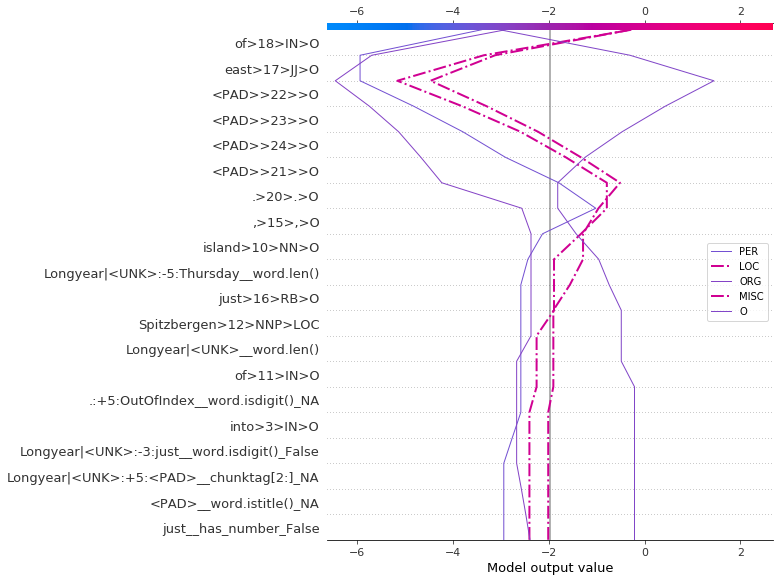

Summary plot with top 10 features and for entity LOC:


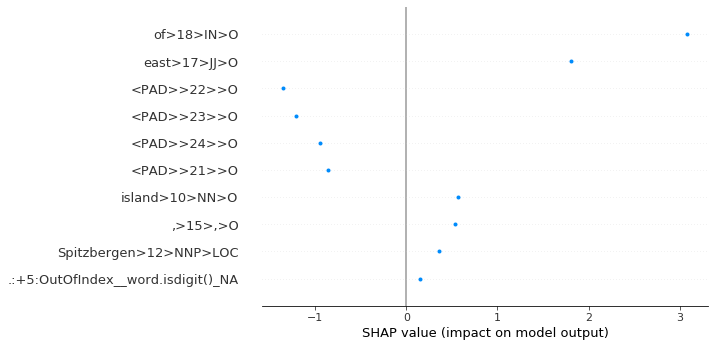

None

Summary plot for all classes together:


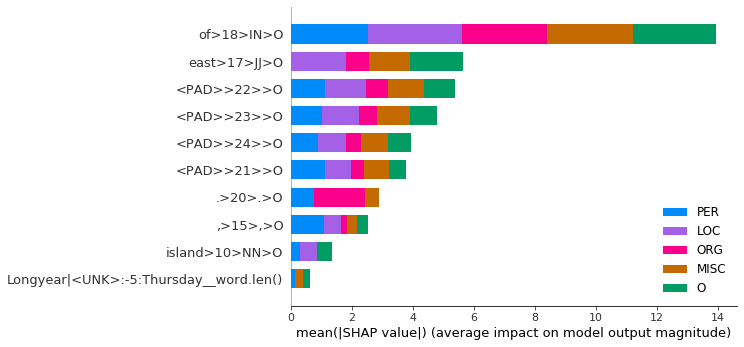

None

top 10 fetures and SHAP values for all classes together


,PER,LOC,ORG,MISC,O
of>18>IN>O,2.535121,3.074758,2.792079,2.822111,-2.714482
east>17>JJ>O,0.000000,1.804579,0.759913,1.346604,-1.750817
<PAD>>22>>O,-1.120042,-1.354145,-0.712811,-1.171335,1.017245
<PAD>>23>>O,-1.022153,-1.214420,-0.608443,-1.072214,0.898055
<PAD>>24>>O,-0.888056,-0.943609,-0.463065,-0.891688,0.771134
<PAD>>21>>O,-1.115323,-0.857178,-0.437469,-0.816778,0.571365
.>20>.>O,-0.771219,0.000000,-1.668794,0.448433,0.000000
",>15>,>O",1.110211,0.537481,-0.191810,0.322101,-0.382712
island>10>NN>O,0.306765,0.564481,0.000000,0.000000,-0.472417
Longyear|<UNK>:-5:Thursday__word.len(),0.146470,0.000000,0.000000,0.274696,-0.217512



Sentence for explanation: His aides said Arafat would hold the weekly meeting of the Palestinian self-rule Authority 's cabinet in Nablus on Saturday .
Word for explanation: Nablus
Predicted named entity for the words: LOC
Actual named entity for the words: LOC



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1/1 [==============================] - 0s 298ms/step



Force plot for entity LOC:


Top 10 features and SHAP values for entity LOC:


,1
in>16>IN>O,2.397814
cabinet>15>NN>O,1.320640
Authority>13>NNP>ORG,0.476808
self-rule>12>JJ>ORG,0.237593
's>14>POS>O,0.236020
Palestinian>11>JJ>ORG,0.199372
of>9>IN>O,0.151101


Multiple output decision ploit highlighting entity LOC and PER:


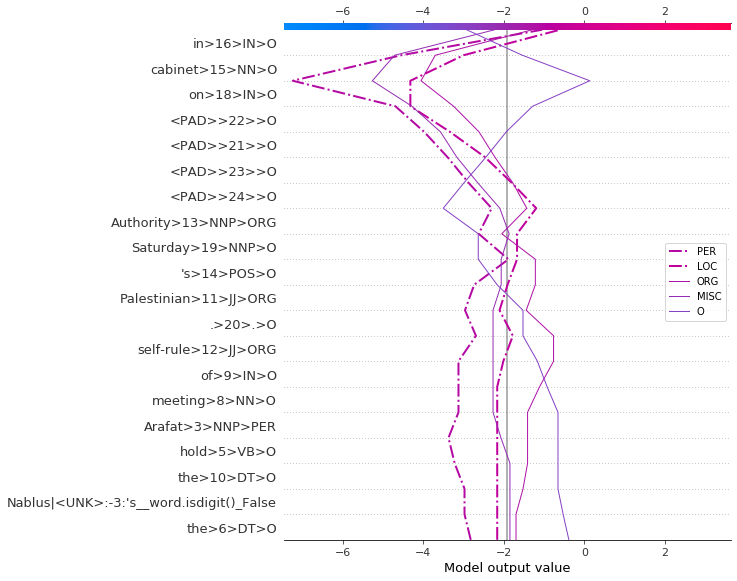

Summary plot with top 10 features and for entity LOC:


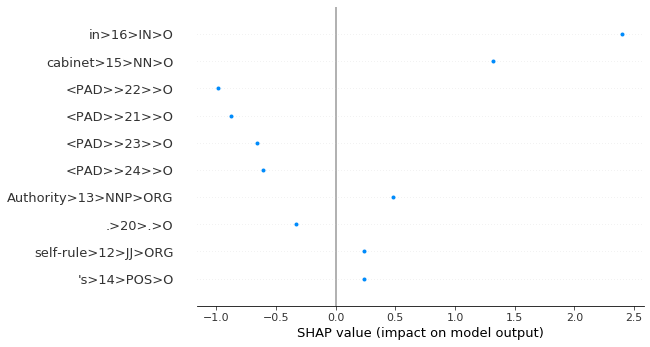

None

Summary plot for all classes together:


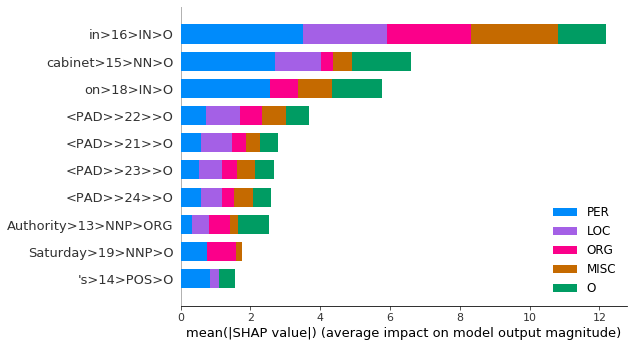

None

top 10 fetures and SHAP values for all classes together


,PER,LOC,ORG,MISC,O
in>16>IN>O,3.502863,2.397814,2.411285,2.486595,-1.385198
cabinet>15>NN>O,2.693077,1.320640,0.354436,0.551777,-1.676104
on>18>IN>O,-2.550464,0.000000,-0.809813,-0.982584,1.423592
<PAD>>22>>O,-0.713306,-0.981731,-0.629282,-0.707428,0.651079
<PAD>>21>>O,-0.585632,-0.877853,-0.398409,-0.409970,0.510268
<PAD>>23>>O,-0.518765,-0.659624,-0.442236,-0.518069,0.541908
<PAD>>24>>O,-0.575477,-0.609278,-0.349352,-0.549961,0.516106
Authority>13>NNP>ORG,0.322492,0.476808,0.622017,-0.230513,-0.870488
Saturday>19>NNP>O,-0.739478,0.000000,-0.833935,0.196507,0.000000
's>14>POS>O,0.852337,0.236020,0.000000,0.000000,-0.470194


In [52]:
shap.initjs()
# explanation for LOC close predictions
visualize_kernel_shap_explanation(KSHAP_explainer_generator, ref_flat_input,validate_sentences, 
                                  idx2ent,LOC_accurate_expl_selected_dict_10_random)

### MISC

In [53]:
MISC_accurate_expl_selected_dict_10_random

{(289, 'MISC', 0.45351314544677734): {'word_indx': [5],
  'p_i': 3,
  'p_i_next': 0,
  'pred_tag_next': 'PER',
  'p_next': 0.4146538375431798,
  'is_accurate': True,
  'actual_tag': ['MISC']}}

In [54]:
# LIME explanation for MISC close predictions
visualize_LIME_explanations(LIME_explainer_generator, LIME_explainer, 
                            validate_sentences, MISC_accurate_expl_selected_dict_10_random)


Sentence for explanation: GOLF - LEADING SCORES AT GREATER MILWAUKEE OPEN .
Word for explanation: GREATER
Predicted named entity for the words: MISC
Actual named entity for the words: MISC


split() requires a non-empty pattern match.

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Sentence for explanation: GOLF - LEADING SCORES AT GREATER MILWAUKEE OPEN .
Word for explanation: GREATER
Predicted named entity for the words: MISC
Actual named entity for the words: MISC
1/1 [==============================] - 0s 64ms/step



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Force plot for entity MISC:


Top 10 features and SHAP values for entity MISC:


,3
OPEN>7>NNP>MISC,2.830663
AT>4>NNP>O,1.912409
.>8>.>O,0.603768
LEADING>2>NNP>O,0.393061


Multiple output decision ploit highlighting entity MISC and PER:


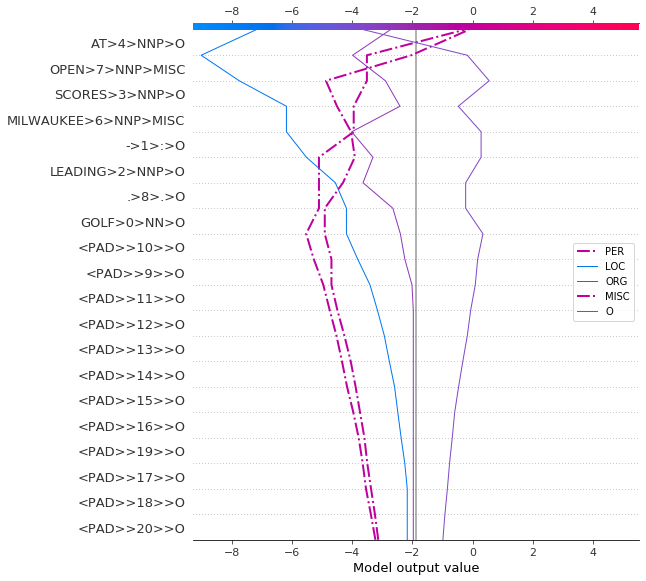

Summary plot with top 10 features and for entity MISC:


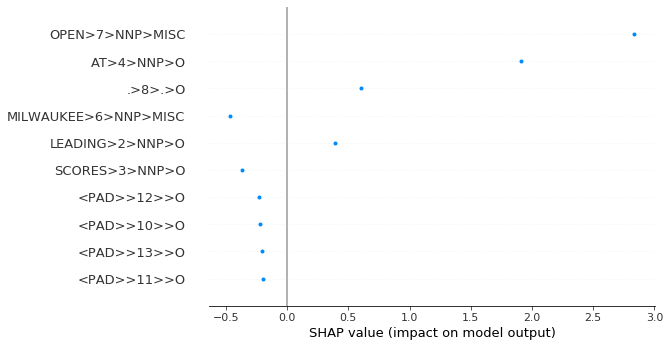

None

Summary plot for all classes together:


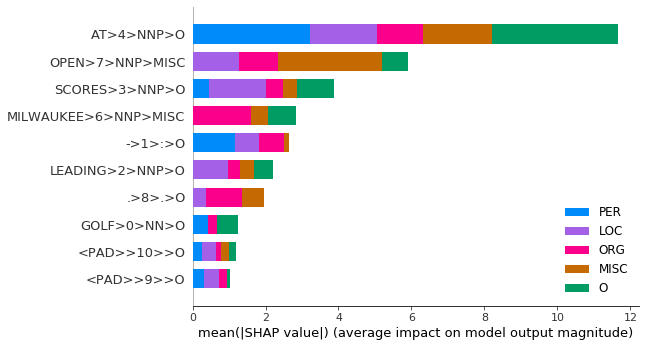

None

top 10 fetures and SHAP values for all classes together


,PER,LOC,ORG,MISC,O
AT>4>NNP>O,3.232653,1.822206,1.251471,1.912409,-3.434321
OPEN>7>NNP>MISC,0.000000,-1.265001,-1.088474,2.830663,-0.724953
SCORES>3>NNP>O,0.437648,-1.564866,-0.484057,-0.366304,1.024853
MILWAUKEE>6>NNP>MISC,0.000000,0.000000,1.601301,-0.468098,-0.756476
->1>:>O,1.152727,-0.663051,-0.704122,-0.123243,0.000000
...,...,...,...,...,...
<PAD>:-4:<PAD>__word.isupper()_NA,0.000000,0.007492,0.000000,0.000000,0.000000
OPEN__BOS+1_NA,0.000000,-0.005669,0.000000,0.000000,0.000000
<PAD>:+1:<PAD>__word.isdigit()_False,0.000000,0.005395,0.000000,0.000000,0.000000
MILWAUKEE:+3:<PAD>__word_format_summary_NA,0.000000,0.000000,0.000000,-0.004431,0.000000


In [55]:
shap.initjs()
# KSHAP explanation for MISC close predictions
visualize_kernel_shap_explanation(KSHAP_explainer_generator, ref_flat_input,validate_sentences,
                                  idx2ent,MISC_accurate_expl_selected_dict_10_random)